<a href="https://colab.research.google.com/github/keshavTUM/Semantic-SAM/blob/main/ImageRetrivalAndAutomated_dataset_annotation_and_evaluation_with_grounding_dino_and_sam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Automated Dataset Generation with Grounding DINO + Segment Anything Model (SAM)

---

In this tutorial, you will learn how to automatically annotate your images using two groundbreaking models - [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) and [Segment Anything Model (SAM)](https://github.com/facebookresearch/segment-anything). You can then use this dataset to train a real-time object detection or instance segmentation model. Annotation of images using polygons in the traditional way is extremely time-consuming and expensive. With Grounding DINO and SAM, initial annotation takes only a few minutes and your work is reduced to manual verification of obtained labels.

![auto-annotation-with-grounded-sam](https://media.roboflow.com/notebooks/examples/auto-annotation-with-grounded-sam.png)

*Figure showing the effects of automatic annotation. The raw image on the left; Object detection annotations obtained with Grounding DINO in the middle; Instance segmentation annotations obtained with Grounding DINO + SAM on the right.*

## Complementary Materials

---

Want to learn more? 🤓 We have prepared separate tutorials where you can learn how to use Grounding DINO and Segment Anything Model (SAM). You will find all the necessary links below.

- Segment Anything Model

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/facebookresearch/segment-anything) [![arXiv](https://img.shields.io/badge/arXiv-2304.02643-b31b1b.svg)](https://arxiv.org/abs/2304.02643) [![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-segment-anything-with-sam.ipynb) [![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/D-D6ZmadzPE) [![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/how-to-use-segment-anything-model-sam)

- Grounding DINO

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/IDEA-Research/GroundingDINO) [![arXiv](https://img.shields.io/badge/arXiv-2303.05499-b31b1b.svg)](https://arxiv.org/abs/2303.05499) [![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/zero-shot-object-detection-with-grounding-dino.ipynb) [![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/cMa77r3YrDk) [![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/grounding-dino-zero-shot-object-detection)

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install Grounding DINO and Segment Anything Model
- Load models
- Download Example Data
- Single Image Mask Auto Annotation
- Full Dataset Mask Auto Annotation
- Convert Object Detection to Instance Segmentation Dataset

## Let's begin! 🔥

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [2]:
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

'en_US.UTF-8'

In [3]:
!nvidia-smi

Mon Feb 17 20:18:53 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   64C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [4]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


## Install Grounding DINO and Segment Anything Model

Our project will use two groundbreaking designs - [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) - for zero-shot detection and [Segment Anything Model (SAM)](https://github.com/facebookresearch/segment-anything) - for converting boxes into segmentations. We have to install them first.


In [5]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!git checkout -q 57535c5a79791cb76e36fdb64975271354f10251
!pip install -q -e .

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Counting objects: 100% (240/240), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 463 (delta 176), reused 137 (delta 137), pack-reused 223 (from 1)
Receiving objects: 100% (463/463), 12.87 MiB | 14.74 MiB/s, done.
Resolving deltas: 100% (241/241), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 783.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━

In [6]:
%cd {HOME}

import sys
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

/content
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-50z12ud6
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-50z12ud6
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=4baaf9ba2122191d7dcb396bc9f460a6b942509642f756e0105ed931676c3b67
  Stored in directory: /tmp/pip-ephem-wheel-cache-u2wys6o3/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything


**NOTE:** To glue all the elements of our demo together we will use the [`supervision`](https://github.com/roboflow/supervision) pip package, which will help us **process, filter and visualize our detections as well as to save our dataset**. A lower version of the `supervision` was installed with Grounding DINO. However, in this demo we need the functionality introduced in the latest versions. Therefore, we uninstall the current `supervsion` version and install version `0.6.0`.



In [7]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

import supervision as sv
print(sv.__version__)

Found existing installation: supervision 0.4.0
Uninstalling supervision-0.4.0:
  Successfully uninstalled supervision-0.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision==0.4.0, but you have supervision 0.6.0 which is incompatible.
0.6.0


**NOTE:** At the end of the tutorial we will upload our annotations to [Roboflow](roboflow.com). To automate this process with the API, let's install the `roboflow` pip package.

In [8]:
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 13.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision==0.4.0, but you have supervision 0.6.0 which is incompatible.


### Download Grounding DINO Model Weights

To run Grounding DINO we need two files - configuration and model weights. The configuration file is part of the [Grounding DINO](https://github.com/IDEA-Research/GroundingDINO) repository, which we have already cloned. The weights file, on the other hand, we need to download. We write the paths to both files to the `GROUNDING_DINO_CONFIG_PATH` and `GROUNDING_DINO_CHECKPOINT_PATH` variables and verify if the paths are correct and the files exist on disk.

In [9]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [10]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [11]:
import os

GROUNDING_DINO_CHECKPOINT_PATH = os.path.join(HOME, "weights", "groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


### Download Segment Anything Model (SAM) Weights

As with Grounding DINO, in order to run SAM we need a weights file, which we must first download. We write the path to local weight file to `SAM_CHECKPOINT_PATH` variable and verify if the path is correct and the file exist on disk.

In [12]:
%cd {HOME}
!mkdir -p {HOME}/weights
%cd {HOME}/weights

!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

/content
/content/weights


In [13]:
import os

SAM_CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(SAM_CHECKPOINT_PATH, "; exist:", os.path.isfile(SAM_CHECKPOINT_PATH))

/content/weights/sam_vit_h_4b8939.pth ; exist: True


## Load models

In [14]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Load Grounding DINO Model

In [15]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

/content/GroundingDINO


/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.11/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

/content/GroundingDINO/groundingdino/util/inference.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_checkpoint_path, map_location="cpu")


### Load Segment Anything Model (SAM)

In [16]:
SAM_ENCODER_VERSION = "vit_h"

In [17]:
from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH).to(device=DEVICE)
sam_predictor = SamPredictor(sam)

/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


## Download Example Data

Let's download few example images. Feel free to replace my images with yours. All you have to do is upload them to the `{HOME}/data` directory. If you're looking for data, take a peek at [Roboflow Universe](https://universe.roboflow.com/)! You're sure to find something interesting.

In [18]:
f"{HOME}/data"

'/content/data'

In [19]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

/content
/content/data


## Single Image Mask Auto Annotation

Before we automatically annotate the entire dataset let's focus for a moment on a single image.

In [20]:
SOURCE_IMAGE_PATH = f"{HOME}/drive/MyDrive/DATASETS/QueryPic/Query.jpg"
#/content/drive/MyDrive/DATASETS/QueryPic/Query.jpg
CLASSES = ['buildings']
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

### Zero-Shot Object Detection with Grounding DINO

**NOTE:** To get better Grounding DINO detection we will leverage a bit of prompt engineering using `enhance_class_name` function defined below. 👇 You can learn more from our [Grounding DINO tutorial](https://blog.roboflow.com/grounding-dino-zero-shot-object-detection/).

In [21]:
from typing import List

def enhance_class_name(class_names: List[str]) -> List[str]:
    return [
        f"all {class_name}s"
        for class_name
        in class_names
    ]

/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:1044: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/content/GroundingDINO/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocas

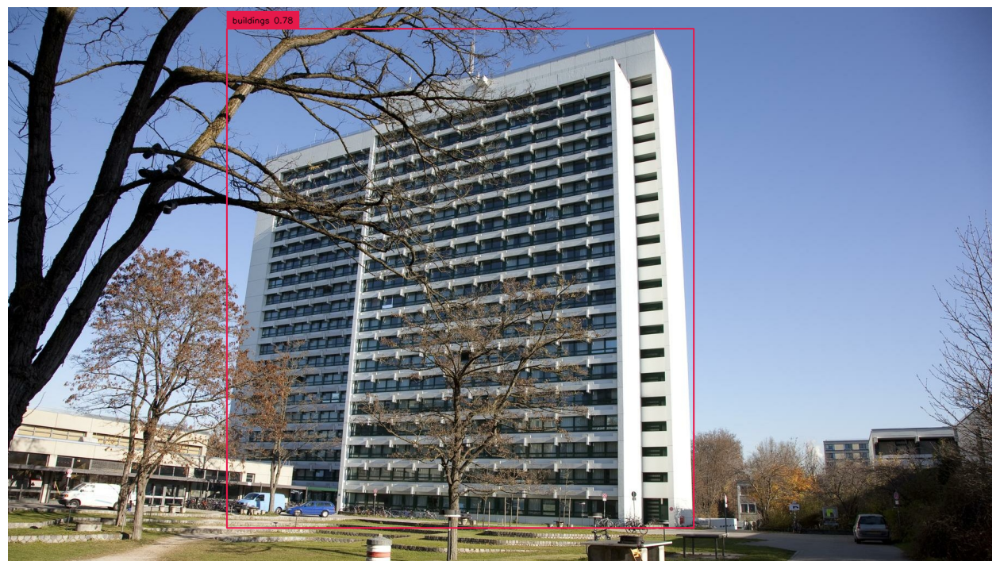

In [22]:
import cv2
import supervision as sv

# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_classes(
    image=image,
    classes=enhance_class_name(class_names=CLASSES),
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections]
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

### Prompting SAM with detected boxes

In [23]:
import numpy as np
from segment_anything import SamPredictor


def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
    sam_predictor.set_image(image)
    result_masks = []
    for box in xyxy:
        masks, scores, logits = sam_predictor.predict(
            box=box,
            multimask_output=True
        )
        index = np.argmax(scores)
        result_masks.append(masks[index])
    return np.array(result_masks)

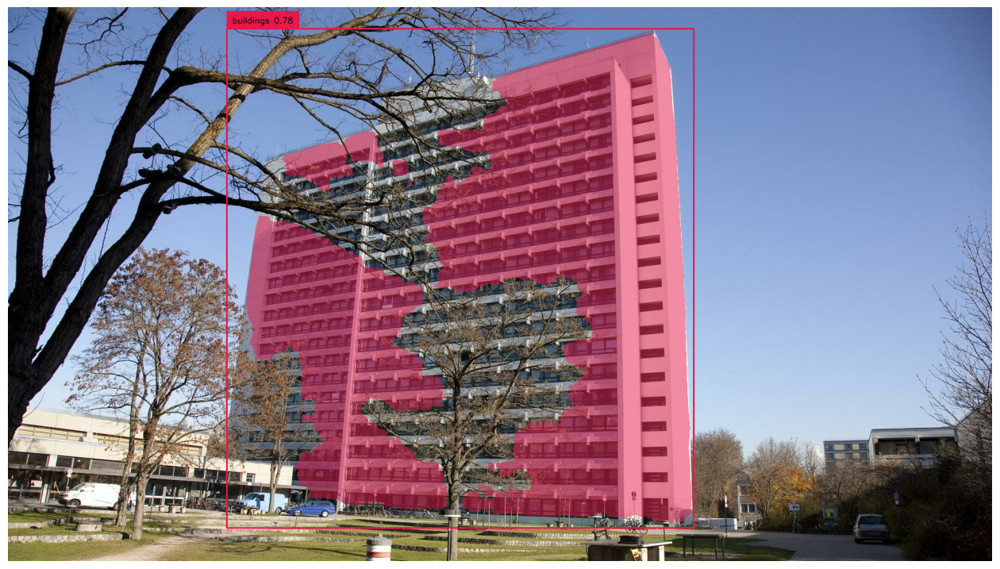

In [24]:
import cv2

# convert detections to masks
detections.mask = segment(
    sam_predictor=sam_predictor,
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
    xyxy=detections.xyxy
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections]
annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_image, (16, 16))

In [25]:
'''import math

grid_size_dimension = math.ceil(math.sqrt(len(detections.mask)))

titles = [
    CLASSES[class_id]
    for class_id
    in detections.class_id
]

sv.plot_images_grid(
    images=detections.mask,
    titles=titles,
    grid_size=(grid_size_dimension, grid_size_dimension),
    size=(16, 16)
)'''

'import math\n\ngrid_size_dimension = math.ceil(math.sqrt(len(detections.mask)))\n\ntitles = [\n    CLASSES[class_id]\n    for class_id\n    in detections.class_id\n]\n\nsv.plot_images_grid(\n    images=detections.mask,\n    titles=titles,\n    grid_size=(grid_size_dimension, grid_size_dimension),\n    size=(16, 16)\n)'

*italicized text*## Full Dataset Mask Auto Annotation

In [26]:
import os
import cv2
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm

# Directories and thresholds
IMAGES_DIRECTORY = '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50'
LABELS_FILE = '/content/drive/MyDrive/DATASETS/selected_images30-30/dual_labeled_data_50.csv'
SAVE_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
IMAGES_EXTENSIONS = ['jpg', 'jpeg', 'png']
CLASSES = ['buildings']
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25



```
# This is formatted as code
```

### Extract labels from images

In [ ]:
# Create save directory if it doesn't exist
os.makedirs(SAVE_DIR, exist_ok=True)

# Load labels
labels_df = pd.read_csv(LABELS_FILE)

# Extract labels from images
images = {}
annotations = {}

# Function to list files with specific extensions in a directory and its subdirectories
def list_files_with_extensions(directory, extensions):
    file_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(tuple(extensions)):
                file_paths.append(os.path.join(root, file))
    return file_paths

image_paths = list_files_with_extensions(
    directory=IMAGES_DIRECTORY,
    extensions=IMAGES_EXTENSIONS)

print(f"Found {len(image_paths)} images.")
print("Image paths:", image_paths)

for image_path in tqdm(image_paths):
    image_name = os.path.basename(image_path)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Failed to load image: {image_path}")
        continue

    detections = grounding_dino_model.predict_with_classes(
        image=image,
        classes=enhance_class_name(class_names=CLASSES),
        box_threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD
    )

    # Debugging: Print detections
    print(f"Detections for {image_name}: {detections}")

    if detections is not None and len(detections) > 0:
        detections = detections[detections.class_id != None]
        detections.mask = segment(
            sam_predictor=sam_predictor,
            image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
            xyxy=detections.xyxy
        )
        images[image_name] = image
        annotations[image_name] = detections
    else:
        print(f"No valid detections for {image_name}")

plot_images = []
plot_titles = []

box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()

for image_name, detections in annotations.items():
    image = images[image_name]
    plot_images.append(image)
    plot_titles.append(image_name)

    labels = [
        f"{CLASSES[class_id]} {confidence:0.2f}"
        for _, _, confidence, class_id, _
        in detections]
    annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
    annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)
    plot_images.append(annotated_image)
    title = " ".join(set([
        CLASSES[class_id]
        for class_id
        in detections.class_id
    ]))
    plot_titles.append(title)

    # Extract usage_type and arch_style labels
    base_name = image_name.replace('annotated_', '')
    image_path = os.path.join(IMAGES_DIRECTORY, base_name)
    label_row = labels_df[labels_df['image_path'] == image_path]

    # Debugging: Print extracted labels
    print(f"Image: {image_name}, Image Path: {image_path}, Label Row: {label_row}")

    if not label_row.empty:
        usage_type = label_row['usage_type'].values[0]
        arch_style = label_row['arch_style'].values[0]
    else:
        usage_type = "Unknown"
        arch_style = "Unknown"

    # Save annotated image
    save_path = os.path.join(SAVE_DIR, f"annotated_{image_name}")
    cv2.imwrite(save_path, annotated_image)

    # Save masks
    '''for i, mask in enumerate(detections.mask):
        mask_save_path = os.path.join(SAVE_DIR, f"mask_{image_name}_{i}.png")
        cv2.imwrite(mask_save_path, mask.astype(np.uint8) * 255)'''

    # Convert detections to DataFrame and save labels
    detections_df = pd.DataFrame({
        'x_min': detections.xyxy[:, 0],
        'y_min': detections.xyxy[:, 1],
        'x_max': detections.xyxy[:, 2],
        'y_max': detections.xyxy[:, 3],
        'confidence': detections.confidence,
        'class_id': detections.class_id,
        'usage_type': usage_type,  # Add this line
        'arch_style': arch_style   # Add this line
    })
    label_save_path = os.path.join(SAVE_DIR, f"labels_{image_name}.csv")
    detections_df.to_csv(label_save_path, index=False)

'''if len(annotations) > 0:  # Check if there are any annotations
    sv.plot_images_grid(
        images=plot_images,
        titles=plot_titles,
        grid_size=(len(annotations), 2),
        size=(2 * 4, len(annotations) * 4)
    )
else:
    print("No annotations found. Check your Grounding DINO settings or image directory.")'''

Found 400 images.
Image paths: ['/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_1413.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_1969.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_0082.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_1528.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_1081.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_1343.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_0494.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_1913.jpg', '/content/drive/MyDrive/DATASETS/selected_images30-30/Building_labeled_train_data_50/roof/roof_0992.jpg', '/content/driv

  0%|          | 0/400 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/transformers/modeling_utils.py:1044: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.11/dist-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/content/GroundingDINO/groundingdino/models/GroundingDINO/transformer.py:862: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocas

Detections for roof_1413.jpg: Detections(xyxy=array([[1.8480147e+02, 2.5496199e+02, 3.4005579e+02, 3.3808167e+02],
       [5.4740906e-02, 2.6863531e+02, 1.0169766e+02, 3.2373431e+02]],
      dtype=float32), mask=None, confidence=array([0.68803805, 0.51973444], dtype=float32), class_id=array([0, 0]), tracker_id=None)
Detections for roof_1969.jpg: Detections(xyxy=array([[3.9505005e-02, 1.4205032e+02, 2.3048280e+02, 3.5326682e+02],
       [3.1360263e+02, 2.3669635e+02, 5.1181937e+02, 3.6531085e+02]],
      dtype=float32), mask=None, confidence=array([0.6862914, 0.7011285], dtype=float32), class_id=array([0, 0]), tracker_id=None)
Detections for roof_0082.jpg: Detections(xyxy=array([[1.04522705e-01, 2.24142639e+02, 5.04640076e+02, 4.09420288e+02]],
      dtype=float32), mask=None, confidence=array([0.8663362], dtype=float32), class_id=array([0]), tracker_id=None)
Detections for roof_1528.jpg: Detections(xyxy=array([[2.8086853e-01, 1.6943008e+02, 4.7566516e+02, 3.4949020e+02]],
      dtype=f

In [ ]:
import os
import pandas as pd

# Directories
ANNOTATION_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
LABELS_FILE = '/content/drive/MyDrive/DATASETS/selected_images30-30/dual_labeled_data_50.csv'

# Load labels
labels_df = pd.read_csv(LABELS_FILE)

# Function to update CSV files with usage_type and arch_style
def update_csv_files(annotation_dir, labels_df):
    for root, _, files in os.walk(annotation_dir):
        for file in files:
            if file.startswith('labels_') and file.endswith('.csv'):
                # Extract the image name from the file name
                image_name = file.replace('labels_', '').replace('.csv', '')

                # Find the corresponding row in the labels_df
                label_row = labels_df[labels_df['image_path'].str.contains(image_name)]

                if not label_row.empty:
                    usage_type = label_row['usage_type'].values[0]
                    arch_style = label_row['arch_style'].values[0]

                    # Load the existing CSV file
                    csv_path = os.path.join(root, file)
                    detections_df = pd.read_csv(csv_path)

                    # Add the usage_type and arch_style columns
                    detections_df['usage_type'] = usage_type
                    detections_df['arch_style'] = arch_style

                    # Save the updated CSV file
                    detections_df.to_csv(csv_path, index=False)
                    print(f"Updated {csv_path} with usage_type: {usage_type}, arch_style: {arch_style}")
                else:
                    print(f"No matching label found for {image_name}")

# Update the CSV files
update_csv_files(ANNOTATION_DIR, labels_df)

In [ ]:
import os

# Define the directory
ANNOTATION_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'

# Initialize counters
mask_count = 0
label_count = 0
annotated_count = 0

# Iterate through the files in the directory
for root, _, files in os.walk(ANNOTATION_DIR):
    for file in files:
        if file.startswith('mask_'):
            mask_count += 1
        elif file.startswith('labels_'):
            label_count += 1
        elif file.startswith('annotated_'):
            annotated_count += 1

# Print the counts
print(f"Number of mask files: {mask_count}")
print(f"Number of label files: {label_count}")
print(f"Number of annotated image files: {annotated_count}")

In [ ]:
import os
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
from PIL import Image
import pickle

# Load the pre-trained ResNet model
model = resnet50(pretrained=True)
model.eval()

# Define the image transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Function to generate embeddings for an image
def generate_embedding(image_path):
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    with torch.no_grad():
        embedding = model(image)
    return embedding.squeeze().numpy()

# Directory containing annotated images
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'

# Generate embeddings for all annotated images
embeddings = {}
for root, _, files in os.walk(ANNOTATED_DIR):
    for file in files:
        if file.startswith('annotated_'):
            image_path = os.path.join(root, file)
            embedding = generate_embedding(image_path)
            embeddings[file.replace('annotated_', '')] = embedding

# Save embeddings to a file
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
with open(EMBEDDINGS_FILE, 'wb') as f:
    pickle.dump(embeddings, f)

print("Generated and saved embeddings for all annotated images.")

In [ ]:
'''import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
with open(os.path.join(ANNOTATED_DIR, 'embeddings.pkl'), 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
labels = list(embeddings.keys())

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Plot the embeddings in 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with labels
for i, label in enumerate(labels):
    ax.scatter(reduced_embeddings[i, 0], reduced_embeddings[i, 1], reduced_embeddings[i, 2], c='blue', marker='o')
    ax.text(reduced_embeddings[i, 0], reduced_embeddings[i, 1], reduced_embeddings[i, 2], label, size=8, zorder=1, color='k')

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Labels')

plt.show()

In [34]:
import pandas as pd

# Load the label CSV file
LABELS_FILE = '/content/drive/MyDrive/DATASETS/selected_images30-30/dual_labeled_data_50.csv'
labels_df = pd.read_csv(LABELS_FILE)

# Check the columns in the label CSV file
print("Columns in the label CSV file:", labels_df.columns)

# Display the first few rows of the label CSV file to verify the content
print(labels_df.head())

Columns in the label CSV file: Index(['image_path', 'usage_type', 'arch_style', 'confidence'], dtype='object')
                                          image_path usage_type  \
0  /content/drive/MyDrive/DATASETS/selected_image...       roof   
1  /content/drive/MyDrive/DATASETS/selected_image...       roof   
2  /content/drive/MyDrive/DATASETS/selected_image...       roof   
3  /content/drive/MyDrive/DATASETS/selected_image...       roof   
4  /content/drive/MyDrive/DATASETS/selected_image...       roof   

                         arch_style  confidence  
0  American Foursquare architecture    0.289324  
1              Novelty architecture    0.907586  
2          American craftsman style    0.383399  
3              Novelty architecture    0.831095  
4              Novelty architecture    0.887349  


In [35]:
import os
import pandas as pd

# Directories
ANNOTATION_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
LABELS_FILE = '/content/drive/MyDrive/DATASETS/selected_images30-30/dual_labeled_data_50.csv'

# Load labels
labels_df = pd.read_csv(LABELS_FILE)

# Function to update CSV files with usage_type and arch_style
def update_csv_files(annotation_dir, labels_df):
    for root, _, files in os.walk(annotation_dir):
        for file in files:
            if file.startswith('labels_') and file.endswith('.csv'):
                # Extract the image name from the file name
                image_name = file.replace('labels_', '').replace('.csv', '')

                # Find the corresponding row in the labels_df
                label_row = labels_df[labels_df['image_path'].str.contains(image_name)]

                if not label_row.empty:
                    usage_type = label_row['usage_type'].values[0]
                    arch_style = label_row['arch_style'].values[0]

                    # Load the existing CSV file
                    csv_path = os.path.join(root, file)
                    detections_df = pd.read_csv(csv_path)

                    # Add the usage_type and arch_style columns
                    detections_df['usage_type'] = usage_type
                    detections_df['arch_style'] = arch_style

                    # Save the updated CSV file
                    detections_df.to_csv(csv_path, index=False)
                    print(f"Updated {csv_path} with usage_type: {usage_type}, arch_style: {arch_style}")
                else:
                    print(f"No matching label found for {image_name}")

# Update the CSV files
update_csv_files(ANNOTATION_DIR, labels_df)

Updated /content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50/labels_roof_1413.jpg.csv with usage_type: roof, arch_style: American Foursquare architecture
Updated /content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50/labels_roof_1969.jpg.csv with usage_type: roof, arch_style: Novelty architecture
Updated /content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50/labels_roof_0082.jpg.csv with usage_type: roof, arch_style: American craftsman style
Updated /content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50/labels_roof_1528.jpg.csv with usage_type: roof, arch_style: Novelty architecture
Updated /content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50/labels_roof_1081.jpg.csv with usage_type: roof, arch_style: Novelty architecture
Updated /content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50/labels_roof_1343.jpg.csv with usage_type: roof, arch_style: Novelty architecture
Updated /content/drive/MyDrive/DATASETS/selected_image

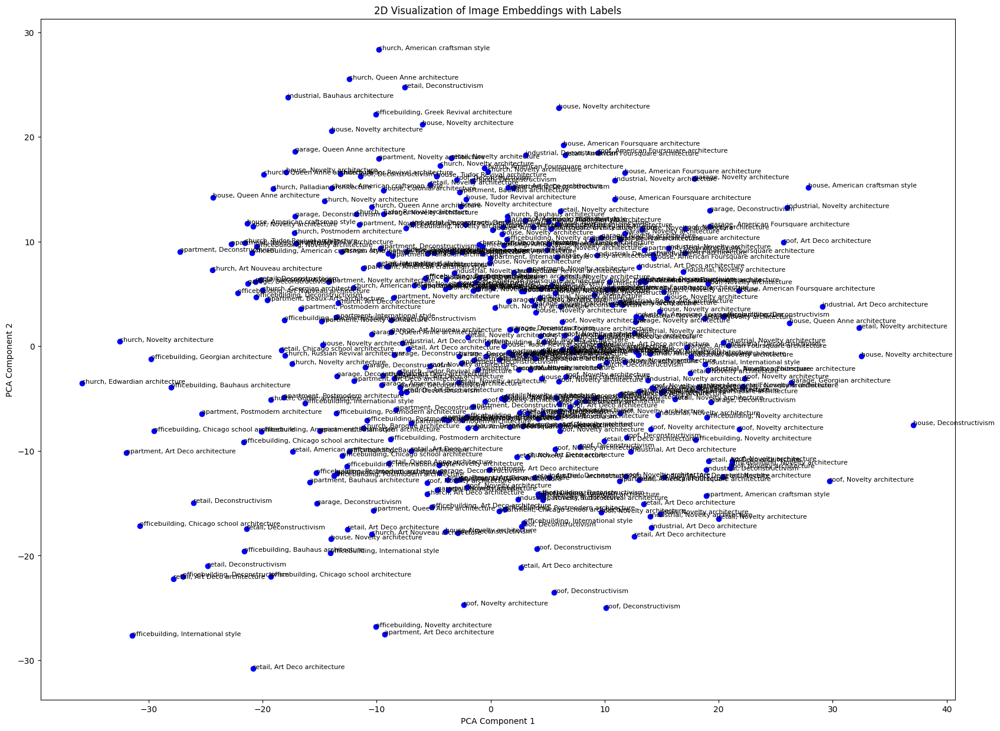

In [36]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract usage_type and arch_style labels from the updated CSV files
labels = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    usage_type = detections_df['usage_type'].values[0]
    arch_style = detections_df['arch_style'].values[0]
    labels.append(f"{usage_type}, {arch_style}")

# Reduce dimensionality using PCA
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(embedding_array)

# Plot the embeddings in 2D with labels
fig, ax = plt.subplots(figsize=(20, 15))

# Scatter plot with labels
for i, label in enumerate(labels):
    x, y = reduced_embeddings[i]
    ax.scatter(x, y, c='blue', marker='o')
    ax.text(x, y, label, size=8, zorder=2, color='k')

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_title('2D Visualization of Image Embeddings with Labels')

plt.show()

Number of embeddings: 400


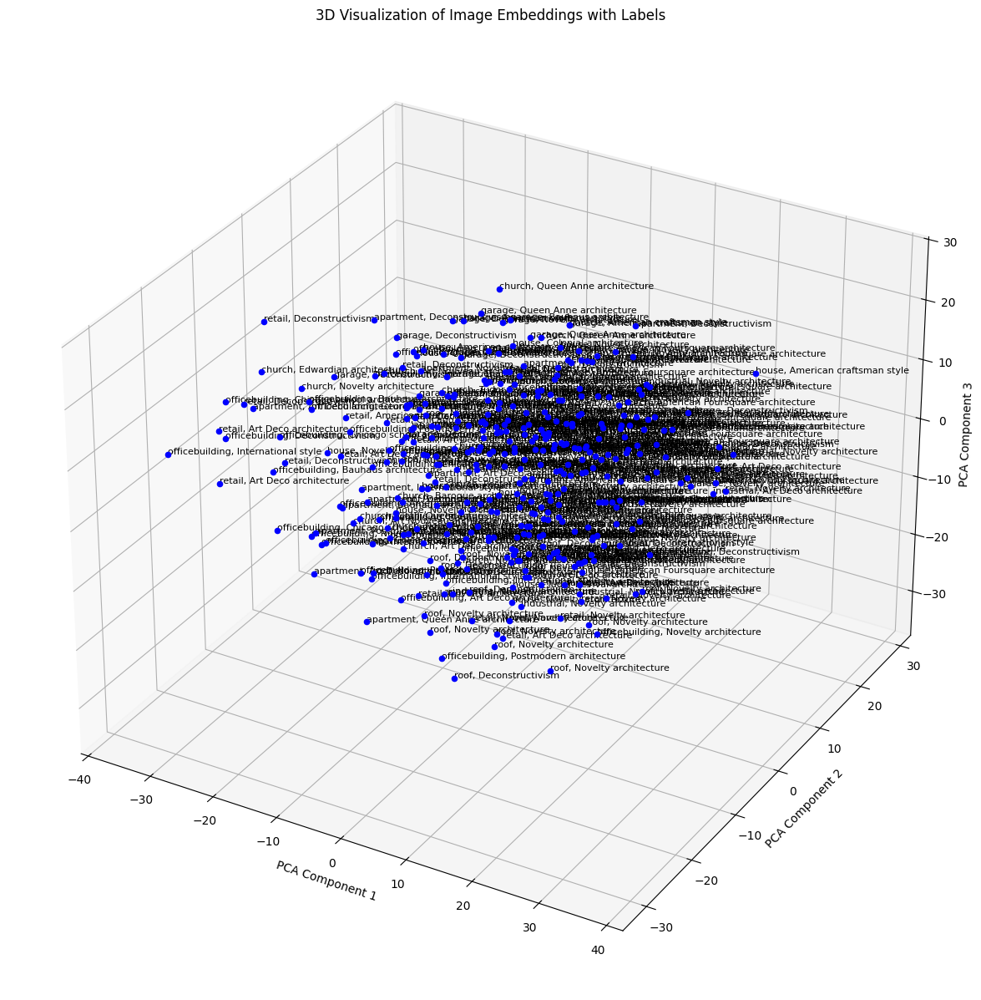

In [37]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract usage_type and arch_style labels from the updated CSV files
labels = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    usage_type = detections_df['usage_type'].values[0]
    arch_style = detections_df['arch_style'].values[0]
    labels.append(f"{usage_type}, {arch_style}")

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Plot the embeddings in 3D with labels
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with labels
for i, label in enumerate(labels):
    x, y, z = reduced_embeddings[i]
    ax.scatter(x, y, z, c='blue', marker='o')
    ax.text(x, y, z, label, size=8, zorder=2, color='k')

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Labels')

# Display the number of embeddings
num_embeddings = len(reduced_embeddings)
print(f"Number of embeddings: {num_embeddings}")

plt.show()

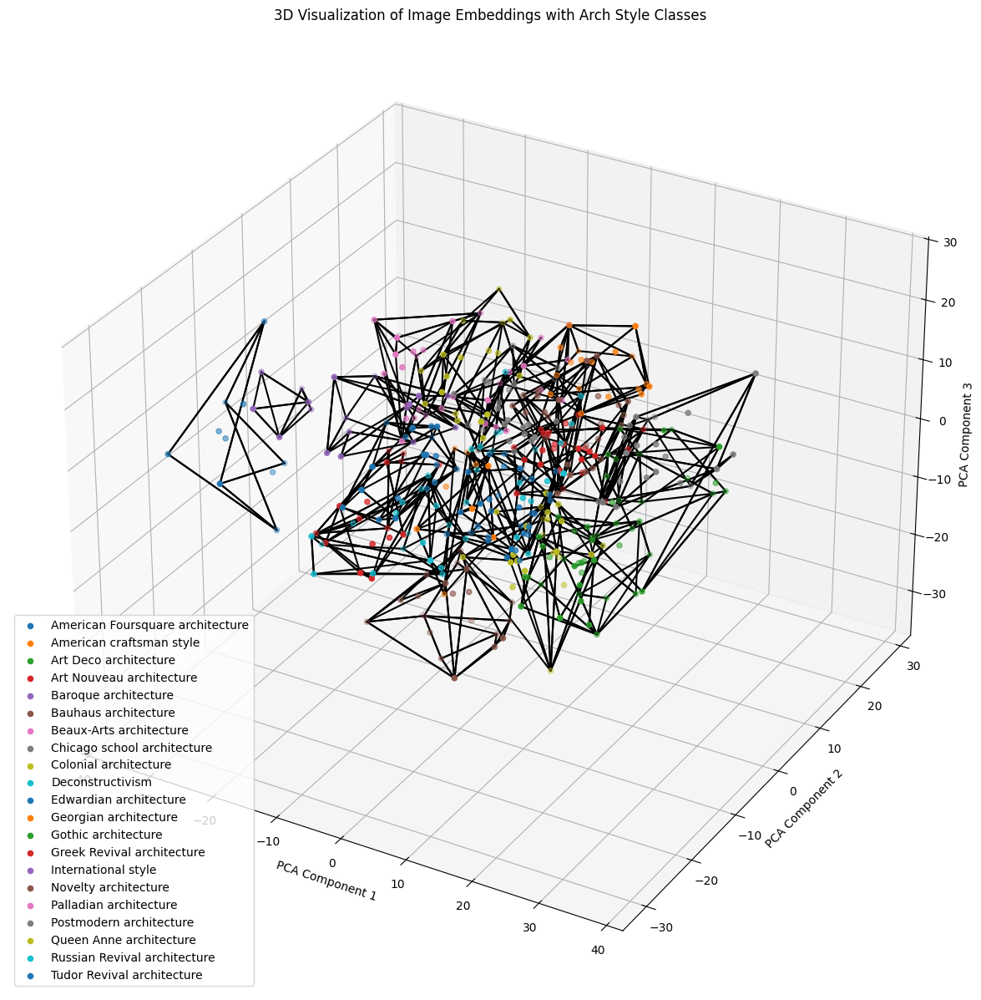

In [43]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract arch_style labels from the updated CSV files
arch_styles = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    arch_style = detections_df['arch_style'].values[0]
    arch_styles.append(arch_style)

# Encode the arch_style labels
arch_label_encoder = LabelEncoder()
encoded_arch_labels = arch_label_encoder.fit_transform(arch_styles)

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=len(np.unique(encoded_arch_labels)))
kmeans.fit(reduced_embeddings)
cluster_labels = kmeans.labels_

# Plot the embeddings in 3D with clusters and convex hulls
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with clusters and convex hulls
for i in range(len(np.unique(cluster_labels))):
    cluster_points = reduced_embeddings[cluster_labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=arch_label_encoder.inverse_transform([i])[0])

    # Compute the convex hull for the cluster points
    if len(cluster_points) >= 4:  # Convex hull requires at least 4 points in 3D
        hull = ConvexHull(cluster_points)
        for simplex in hull.simplices:
            ax.plot(cluster_points[simplex, 0], cluster_points[simplex, 1], cluster_points[simplex, 2], 'k-')

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Arch Style Classes')

# Add legend
ax.legend()

plt.show()


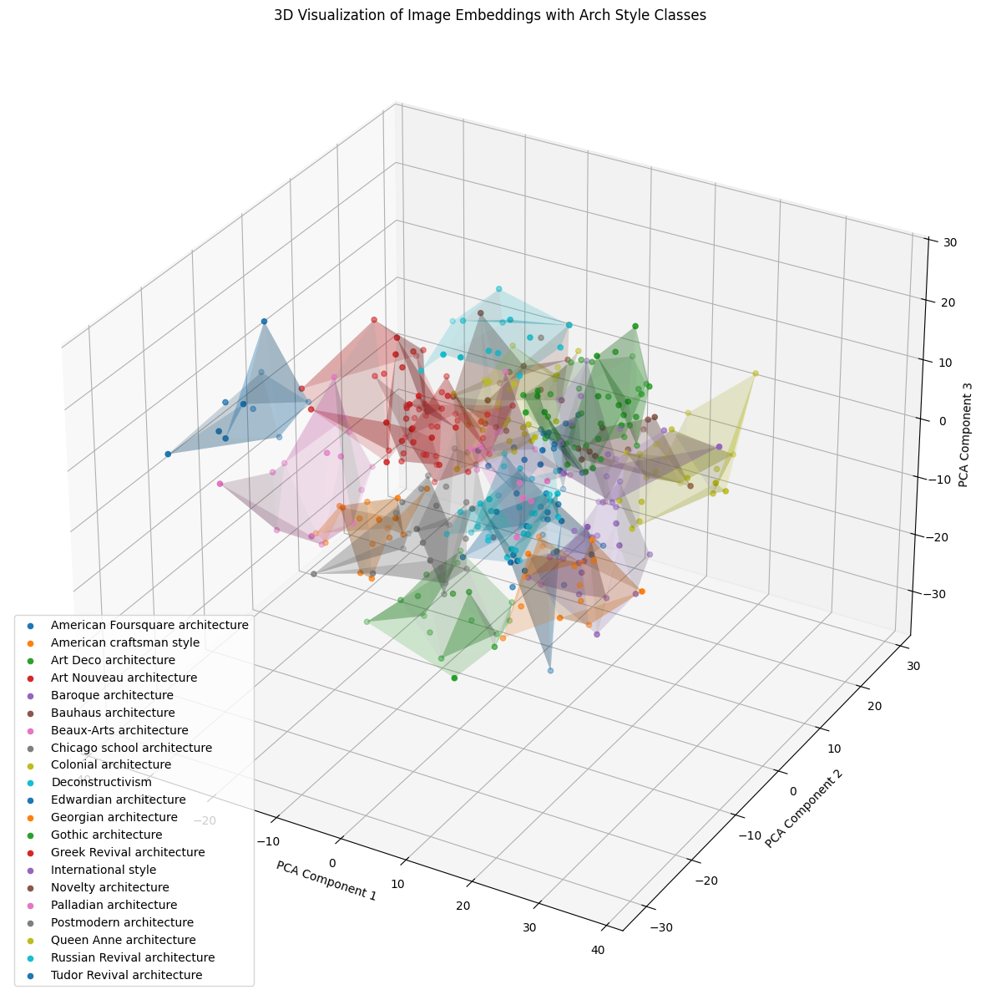

In [46]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract arch_style labels from the updated CSV files
arch_styles = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    arch_style = detections_df['arch_style'].values[0]
    arch_styles.append(arch_style)

# Encode the arch_style labels
arch_label_encoder = LabelEncoder()
encoded_arch_labels = arch_label_encoder.fit_transform(arch_styles)

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=len(np.unique(encoded_arch_labels)))
kmeans.fit(reduced_embeddings)
cluster_labels = kmeans.labels_

# Plot the embeddings in 3D with clusters and convex hulls
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with clusters and convex hulls
for i in range(len(np.unique(cluster_labels))):
    cluster_points = reduced_embeddings[cluster_labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=arch_label_encoder.inverse_transform([i])[0])

    # Compute the convex hull for the cluster points
    if len(cluster_points) >= 4:  # Convex hull requires at least 4 points in 3D
        hull = ConvexHull(cluster_points)
        # Plot the volume covered by each class using alpha blending for better visualization
        ax.plot_trisurf(cluster_points[hull.vertices, 0], cluster_points[hull.vertices, 1], cluster_points[hull.vertices, 2], alpha=0.2)

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Arch Style Classes')

# Add legend
ax.legend()

plt.show()

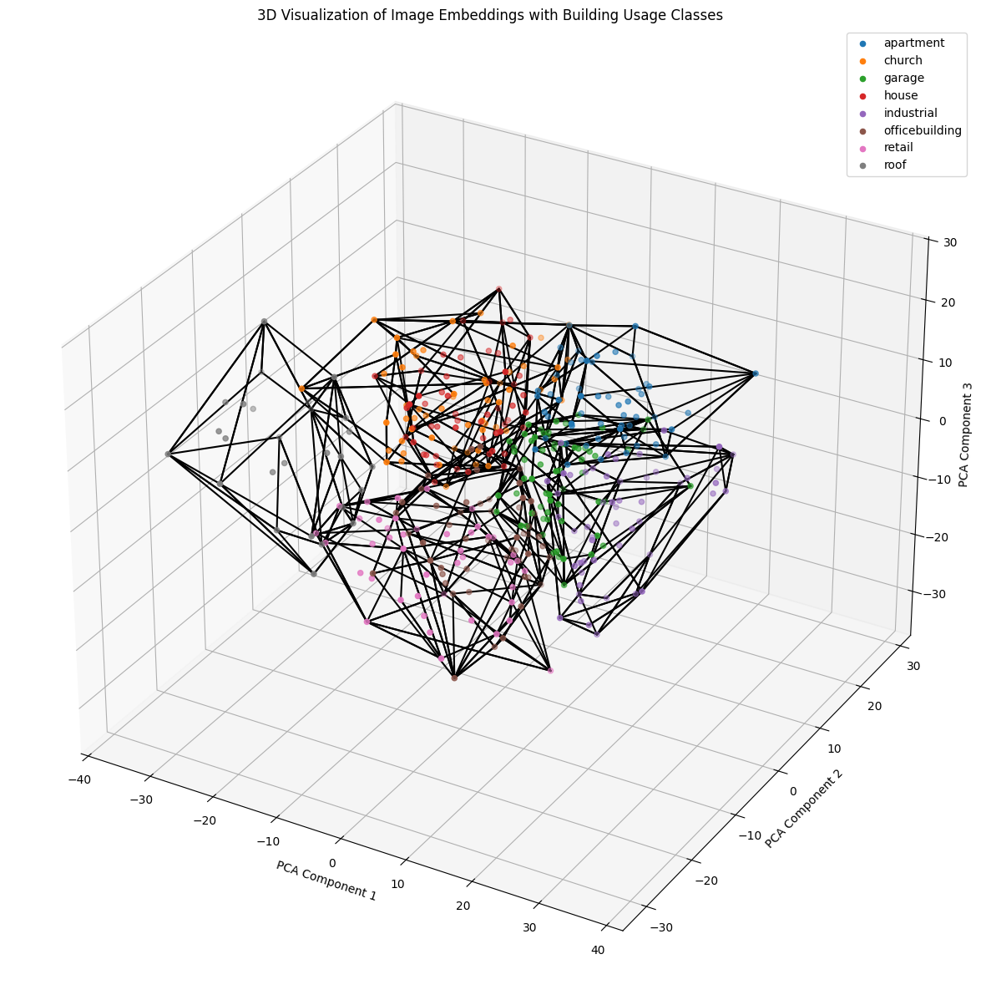

In [44]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract usage_type labels from the updated CSV files
usage_types = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    usage_type = detections_df['usage_type'].values[0]
    usage_types.append(usage_type)

# Encode the usage_type labels
usage_label_encoder = LabelEncoder()
encoded_usage_labels = usage_label_encoder.fit_transform(usage_types)

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=len(np.unique(encoded_usage_labels)))
kmeans.fit(reduced_embeddings)
cluster_labels = kmeans.labels_

# Plot the embeddings in 3D with clusters and convex hulls
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with clusters and convex hulls
for i in range(len(np.unique(cluster_labels))):
    cluster_points = reduced_embeddings[cluster_labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=usage_label_encoder.inverse_transform([i])[0])

    # Compute the convex hull for the cluster points
    if len(cluster_points) >= 4:  # Convex hull requires at least 4 points in 3D
        hull = ConvexHull(cluster_points)
        for simplex in hull.simplices:
            ax.plot(cluster_points[simplex, 0], cluster_points[simplex, 1], cluster_points[simplex, 2], 'k-')

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Building Usage Classes')

# Add legend
ax.legend()

plt.show()


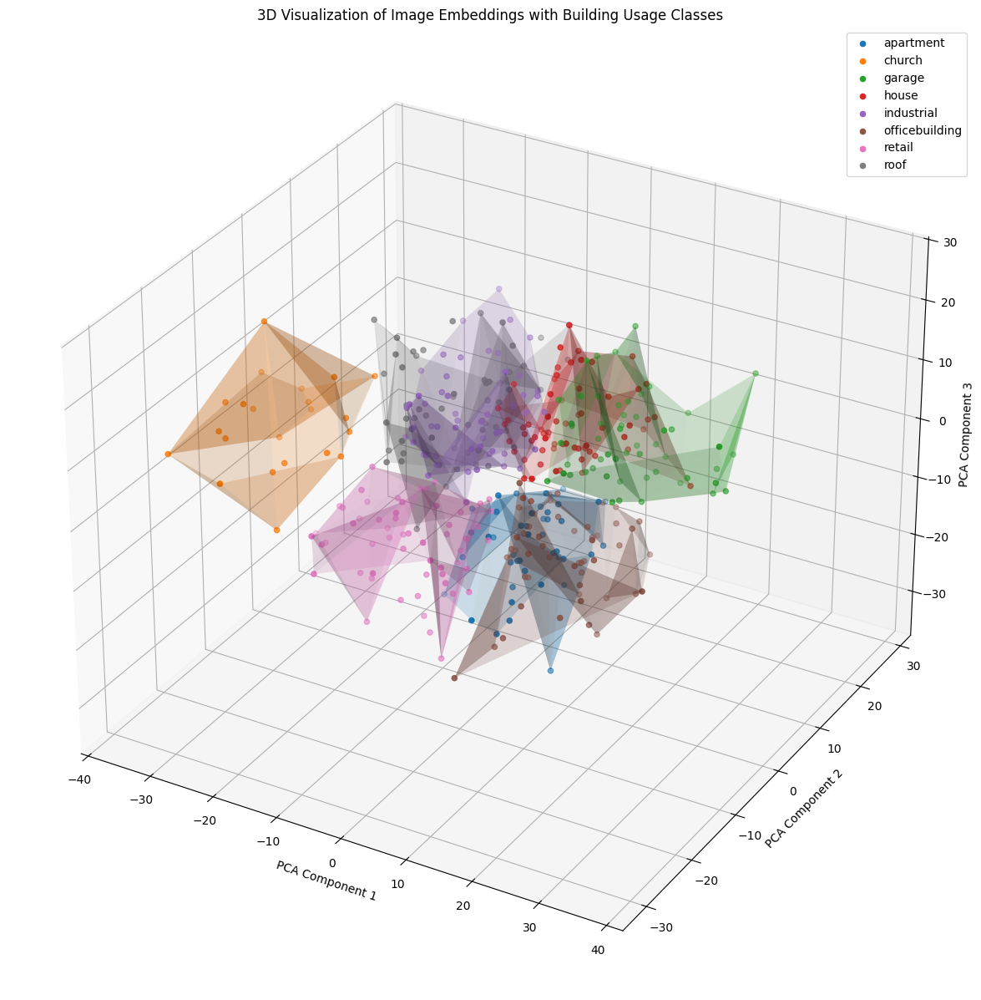

In [45]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract usage_type labels from the updated CSV files
usage_types = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    usage_type = detections_df['usage_type'].values[0]
    usage_types.append(usage_type)

# Encode the usage_type labels
usage_label_encoder = LabelEncoder()
encoded_usage_labels = usage_label_encoder.fit_transform(usage_types)

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=len(np.unique(encoded_usage_labels)))
kmeans.fit(reduced_embeddings)
cluster_labels = kmeans.labels_

# Plot the embeddings in 3D with clusters and convex hulls
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with clusters and convex hulls
for i in range(len(np.unique(cluster_labels))):
    cluster_points = reduced_embeddings[cluster_labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=usage_label_encoder.inverse_transform([i])[0])

    # Compute the convex hull for the cluster points
    if len(cluster_points) >= 4:  # Convex hull requires at least 4 points in 3D
        hull = ConvexHull(cluster_points)
        # Plot the volume covered by each class using alpha blending for better visualization
        ax.plot_trisurf(cluster_points[hull.vertices, 0], cluster_points[hull.vertices, 1], cluster_points[hull.vertices, 2], alpha=0.2)

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Building Usage Classes')

# Add legend
ax.legend()

plt.show()


Okay, let's break down what these embeddings are and what they represent in your code.

What are embeddings?

In the context of machine learning and computer vision, embeddings are essentially dense vector representations of complex data, like images in your case. They capture the essence or core features of the data in a lower-dimensional numerical form. Think of them as a way to translate visual information (images) into a format that algorithms can easily understand and work with.

What are embeddings containing in your code?

In your code, you are using a pre-trained ResNet-50 model to generate embeddings for your masked images of buildings. Here's a breakdown of what these embeddings contain:

    Visual features: The ResNet-50 model is trained to identify various features in images like edges, textures, shapes, and patterns. When you feed your masked building images to the model, it extracts these visual features and encodes them into the embedding vector.
    Semantic information: Because ResNet-50 is trained on a massive dataset (ImageNet), it has also learned some semantic understanding of objects and scenes. This means the embeddings also contain information related to the building itself (architectural style, usage, materials, etc.)
    Compressed representation: The embedding vector is a much smaller representation than the original image, making it efficient for computations. It's like a summary or fingerprint of the building's visual characteristics.

Why are embeddings useful in your project?

    Similarity and Clustering: You can use these embeddings to compare different buildings. Buildings with similar visual features or semantic meanings will have embeddings that are closer together in the vector space. This can be used for tasks like clustering, grouping similar buildings, or building a search functionality to find buildings similar to a given query image.
    Visualization: By reducing the dimensionality of the embeddings (using PCA in your case), you can visualize how different buildings relate to each other in a lower-dimensional space (2D or 3D plots). This helps you understand the underlying structure of your data.
    Training for downstream tasks: These image embeddings can be used as input features for other machine learning models. For example, you could train a classifier to predict the architectural style of a building based on its embedding.


Step 1: Install FAISS

In [38]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!pip install faiss-cpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.7/30.7 MB 41.7 MB/s eta 0:00:00


Step 2: Index Embeddings and Perform Image Retrieval by     # Determine the most frequent usage_type and arch_style

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


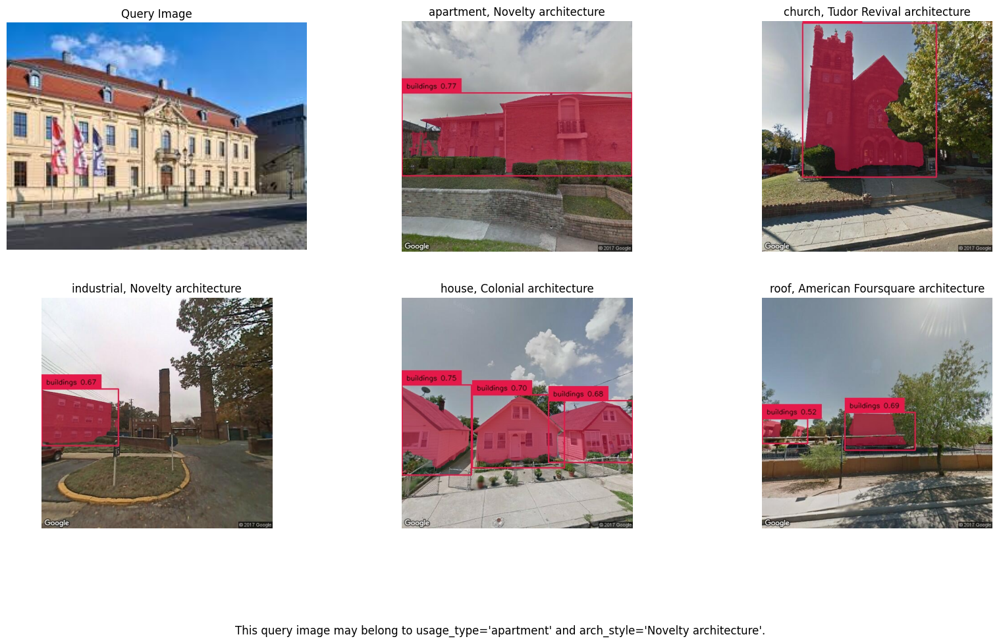

In [39]:
import faiss
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50
import pickle
import os
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get image names
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Create FAISS index
d = embedding_array.shape[1]  # Dimension of the embeddings
index = faiss.IndexFlatL2(d)  # L2 distance index
index.add(embedding_array)    # Add embeddings to the index

# Function to generate embedding for a query image
def generate_embedding(image_path):
    model = resnet50(pretrained=True)
    model.eval()
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    with torch.no_grad():
        embedding = model(image)
    return embedding.squeeze().numpy()

# Function to perform image retrieval
def retrieve_image(query_image_path, k=5):
    query_embedding = generate_embedding(query_image_path).reshape(1, -1)
    D, I = index.search(query_embedding, k)  # Perform search
    retrieved_images = [image_names[i] for i in I[0]]
    return retrieved_images

# Function to display the query image and retrieved images in a grid layout with verdict
def display_results_grid_with_verdict(query_image_path, retrieved_images):
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))

    # Display the query image
    query_img = Image.open(query_image_path)
    axes[0, 0].imshow(query_img)
    axes[0, 0].set_title("Query Image")
    axes[0, 0].axis('off')

    usage_types = []
    arch_styles = []

    # Display the retrieved images with labels
    for i, img_name in enumerate(retrieved_images[:5]):
        row = (i + 1) // 3
        col = (i + 1) % 3
        img_path = os.path.join(ANNOTATED_DIR, f"annotated_{img_name}")
        img = Image.open(img_path)
        axes[row, col].imshow(img)

        csv_path = os.path.join(ANNOTATED_DIR, f"labels_{img_name}.csv")
        detections_df = pd.read_csv(csv_path)
        usage_type = detections_df['usage_type'].values[0]
        arch_style = detections_df['arch_style'].values[0]

        usage_types.append(usage_type)
        arch_styles.append(arch_style)

        axes[row, col].set_title(f"{usage_type}, {arch_style}")
        axes[row, col].axis('off')

    # Hide any unused subplots
    for j in range(len(retrieved_images) + 1, 6):
        row = j // 3
        col = j % 3
        axes[row, col].axis('off')

    # Determine the most frequent usage_type and arch_style
    most_common_usage_type = Counter(usage_types).most_common(1)[0][0]
    most_common_arch_style = Counter(arch_styles).most_common(1)[0][0]

    # Add the verdict as a text below the images
    plt.figtext(0.5, -0.05, f"This query image may belong to usage_type='{most_common_usage_type}' and arch_style='{most_common_arch_style}'.", ha="center", fontsize=12)

    plt.show()

# Path to the query image
query_image_path = '/content/drive/MyDrive/DATASETS/QueryPic/images.jpeg'

# Perform image retrieval
retrieved_images = retrieve_image(query_image_path)

# Display the results in a grid layout with verdict
display_results_grid_with_verdict(query_image_path, retrieved_images)

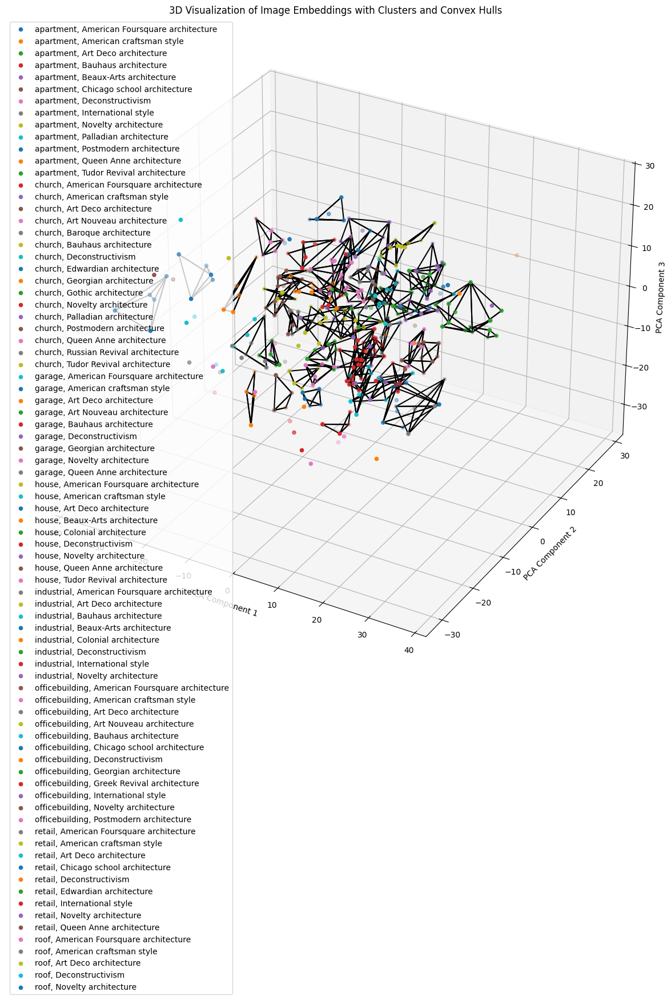

In [41]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull

# Load the embeddings
ANNOTATED_DIR = '/content/drive/MyDrive/DATASETS/selected_images30-30/Annotated_50'
EMBEDDINGS_FILE = os.path.join(ANNOTATED_DIR, 'embeddings.pkl')
if not os.path.exists(EMBEDDINGS_FILE):
    raise FileNotFoundError(f"Embeddings file not found: {EMBEDDINGS_FILE}")

with open(EMBEDDINGS_FILE, 'rb') as f:
    embeddings = pickle.load(f)

# Convert embeddings to a numpy array and get labels
embedding_list = list(embeddings.values())
embedding_array = np.array(embedding_list)
image_names = list(embeddings.keys())

# Extract usage_type and arch_style labels from the updated CSV files
labels = []
for image_name in image_names:
    csv_path = os.path.join(ANNOTATED_DIR, f"labels_{image_name}.csv")
    detections_df = pd.read_csv(csv_path)
    usage_type = detections_df['usage_type'].values[0]
    arch_style = detections_df['arch_style'].values[0]
    labels.append(f"{usage_type}, {arch_style}")

# Encode the labels
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Reduce dimensionality using PCA
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(embedding_array)

# Perform KMeans clustering
kmeans = KMeans(n_clusters=len(np.unique(encoded_labels)))
kmeans.fit(reduced_embeddings)
cluster_labels = kmeans.labels_

# Plot the embeddings in 3D with clusters and convex hulls
fig = plt.figure(figsize=(20, 15))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot with clusters and convex hulls
for i in range(len(np.unique(cluster_labels))):
    cluster_points = reduced_embeddings[cluster_labels == i]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=label_encoder.inverse_transform([i])[0])

    # Compute the convex hull for the cluster points
    if len(cluster_points) >= 4:  # Convex hull requires at least 4 points in 3D
        hull = ConvexHull(cluster_points)
        for simplex in hull.simplices:
            ax.plot(cluster_points[simplex, 0], cluster_points[simplex, 1], cluster_points[simplex, 2], 'k-')

# Set labels
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Visualization of Image Embeddings with Clusters and Convex Hulls')

# Add legend
ax.legend()

plt.show()
